# Classifying Song Popularity and Genre Based on Spotify Attributes

Contents
1. Popularity Classification
2. Genre Classification
3. Classification Discussion
4. Unsupervised Learning: Clustering

By Angela Fan

# Popularity Classification

## Introduction

The purpose of this portion of our project is to develop a model that will predict the popularity of songs in our modern day. We are interested in analyzing which songs are most likely to trend among the general public, and specifically which factors contribute to the popularity of these songs. We are interested in whether features such as a song's key, danceability, and energy among other features have an effect on its popularity on Spotify.

### Streaming and Spotify

Streaming has become the most popular way to consume music by far in the last decade. Spotify is a music streaming service that boasts over 350 million users worldwide and over 150 million subscribers, by far the most popular platform to listen to music. Spotify not only has become a way to listen to music, but also has incorporated a social aspect to listening. Users can follow each other, see what friends are listening to, and make playlists together. Furthermore, the launch of Spotify Wrapped in 2016 which gave every user a personal summary and wrap-up of what they listened to for that year has inspired other platforms such as Apple Music and hundreds of other companies such as Urban Outfitters to do the same.

Popularity of a song on spotify reflect the streams of a song, shares of the song, and first-time discoveries of the song. Due to Spotify being a global platform, a song's popularity on the platform is reflective of a song's popularity around the world. We are using data from Spotify as opposed to data from other music charts such as Billboard to get a better perspective on what factors make a song popular not just in the US, but globally. According to Spotify, the 'popularity' metric in this dataset is calculated by an algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are. Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past. Duplicate tracks (e.g. the same track from a single and an album) are rated independently.

### Why?

The landscape of the music industry has shifted dramatically over time; currently, the most popular artists and genres are increasingly influenced by the Internet and social media. Streaming has become the dominant method of consuming music as opposed to the purchase of physical media. Furthermore, the ability of songs and artists to go viral on social media platforms such as TikTok has had massive effects on streaming charts. Small artists can gain thousands of views and likes overnight due to the influence and widespread audience available through social media. Furthermore, many songs that were released decades ago have seen resurgences in popularity due to their use on social media. We are interested in whether we can predict the most popular songs being streamed today by using various musical metrics such as energy and the key of the song. We would like to investigate whether certain song attributes can “guarantee” the popularity of a song on streaming platforms. This is a question that small artists and big music labels alike have been trying to answer to produce a hit song.



## Load Packages and Data

This data was taken from Kaggle's "Spotify Tracks Dataset" (https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset/data).

In [1]:
# import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from tensorflow.keras import layers, initializers, utils
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder, StandardScaler
import seaborn as sns
import time
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import KernelPCA
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer


2024-03-21 16:41:13.195732: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# read in data
data = pd.read_csv('https://github.com/angelafan03/16bproject/blob/main/spotify_tracks.csv?raw=true')

## Data Exploration and Processing

Let's get some basic information about our dataset, what it contains, and what it looks like.

In [3]:
data.shape

(114000, 21)

This means that we have 114,000 songs in our dataset, and we have 21 features about each song. Because the dataset is so large, we will randomly sample 30,000 entries from the dataset to make sure we don't run into any crashes later in our project.

In [4]:
# randomly sample 30,000 entries from the dataset
data = data.sample(30000)

Let's take a look at exactly what features we are working with.

In [5]:
# get column names of the dataset
data.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

We have the column names, but not much information about what is in them. Let's try to get a better look at our dataset as a whole.

In [6]:
# show first 5 rows of the dataframe and all columns
pd.set_option("display.max_rows", None, "display.max_columns", None)
data.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
87064,87064,5YtIkHosMnyhM3ZwcAnvtd,Chuck Berry,Best Christmas Playlist Ever 2022,Run Rudolph Run,0,162897,False,0.647,0.876,10,-5.662,1,0.1850,0.88100,0.000036,0.2600,0.949,151.925,4,r-n-b
15566,15566,2LO5hQnz5rEaRwkGUvZcHN,Rocco,spin you round,spin you round,66,126610,False,0.663,0.283,1,-15.806,1,0.0899,0.27000,0.000000,0.1890,0.387,146.228,4,chill
109613,109613,7pgFHs8K5OgB9PGDY3sysE,Paul Kalkbrenner,7,Feed Your Head,60,346240,False,0.793,0.339,5,-14.317,1,0.0555,0.16600,0.809000,0.1100,0.266,125.993,4,techno
41635,41635,1smm7AsIRp0TnSdVfP4iF0,Ghoultown,Life After Sundown,Dead Outlaw,22,175853,False,0.504,0.987,1,-3.307,0,0.1230,0.00459,0.000039,0.0787,0.471,141.138,4,goth
86240,86240,3V33m9n9gtnal5rSwdLjYt,Last Child,Our Biggest Thing Ever,Cinta Semestinya,46,200106,False,0.482,0.890,2,-5.076,1,0.0304,0.00323,0.000000,0.0904,0.699,99.808,4,punk


In [7]:
# get all unique values in the track_genre column
data.track_genre.unique()

array(['r-n-b', 'chill', 'techno', 'goth', 'punk', 'reggae', 'dub',
       'pagode', 'piano', 'disney', 'brazil', 'classical', 'comedy',
       'turkish', 'sad', 'metalcore', 'show-tunes', 'sertanejo',
       'hardstyle', 'ambient', 'pop', 'forro', 'romance', 'mpb', 'anime',
       'metal', 'iranian', 'french', 'study', 'latino', 'trip-hop',
       'pop-film', 'dancehall', 'alt-rock', 'j-rock', 'psych-rock',
       'progressive-house', 'cantopop', 'emo', 'mandopop', 'reggaeton',
       'punk-rock', 'indie', 'heavy-metal', 'breakbeat', 'club', 'edm',
       'chicago-house', 'salsa', 'acoustic', 'happy', 'drum-and-bass',
       'rockabilly', 'detroit-techno', 'world-music', 'malay', 'j-idol',
       'jazz', 'latin', 'industrial', 'electronic', 'house', 'j-pop',
       'power-pop', 'new-age', 'children', 'grindcore', 'afrobeat',
       'opera', 'spanish', 'garage', 'sleep', 'guitar', 'ska',
       'rock-n-roll', 'disco', 'indian', 'minimal-techno',
       'singer-songwriter', 'alternative

We can see that there are some columns that aren't relevant to what specifically about a song itself makes it popular, such as Unnamed: 0 which is the index of each item, track_id, the name of the artists of the song, and the song name and album that it came from. We can drop these columns. We will also drop duration_ms because it shouldn't have too much effect on a song's popularity and it also holds values that are much, much larger than other column values which could potentially cause issues with our models and features selection. We will also drop track_genre because there are over 100 genres in the dataset. Some genres are very broad (many genres have romance songs) and some are very specific (such as grindcore), and some appear to be duplicates (kids and children). Furthermore, a track's genre isn't exactly a feature that is inherent to a song, such as its energy or loudness metric.

In [8]:
# drop unneeded cols
data = data.drop(['Unnamed: 0', 'track_id', 'artists',
                  'album_name', 'track_name', 'duration_ms',
                  'track_genre'], axis=1)

Let's make sure there are no NaNs in our dataset.

In [9]:
# get sum of NaNs in dataset
data.isnull().sum().sum()

0

There are none so we are good to go!

Now, we are left with features of the song. Some are self-explanatory, such as the duration in milliseconds of the song and whether it is explicit or not, but let's look at Spotify's documentation and the information from the dataset to understand what exactly metrics such as "danceability" and "instrumentalness" mean. It would be helpful to know what exactly these terms mean so we can make sure we are processing our data fully and understand what goes into a song that makes it popular.

**popularity:** The popularity of a track is a value between 0 and 100, with 100 being the most popular. The popularity is calculated by algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are. Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past. Duplicate tracks (e.g. the same track from a single and an album) are rated independently.

**duration_ms:** The track length in milliseconds

**explicit:** Whether or not the track has explicit lyrics (true = yes it does; false = no it does not OR unknown)

**danceability:** Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable

**energy:** Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale

**key:** The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1

**loudness:** The overall loudness of a track in decibels (dB)
mode: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0

**speechiness:** Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks

**acousticness:** A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic
instrumentalness: Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content

**liveness:** Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live

**valence:** A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry)

**tempo:** The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration

**time_signature:** An estimated time signature. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure). The time signature ranges from 3 to 7 indicating time signatures of 3/4, to 7/4.

**track_genre:** The genre in which the track belongs


Looking at these definitions, we can see that another column that we should process for our analysis and models is the 'speechiness' column. Values below 0.33 most likely represent music, so we should make sure we only have rows that have a speechiness value of <0.33 in our data.

In [10]:
# select only rows with speechiness <= 0.33 to be in our data
data = data[data['speechiness'] <= 0.33]

In our dataset, the 'popularity' column already serves as a measure for song popularity. However, because the score for popularity is such an exact measure from 0-100, this would not be the best column to use as a target label for our models. We would have 100 categories, and each category would likely not have that many entries in it. In addition, trying to classify whether a song has a popularity score of 23 or 24 out of 100 does not seem like such a good classification problem.

So, we will create a new column which will be our target label for this dataset. Our new column will simply measure whether a song is popular or not popular. Songs with a popularity score less than 50 will be classified as not popular, and the rest will be classified as popular.

In [11]:
def is_popular(popularity):
  """
  function that takes in a popularity score from the 'popularity' column in the dataframe
  and returns whether the song is popular or unpopular.
  input: int, the popularity of a song in the dataset
  output: str, whether a song is popular or unpopular.
  """
  if popularity <= 50:
    return 'unpopular'
  else:
    return 'popular'

In [12]:
# apply the is_popular function to the popularity column
data['is_popular'] = data['popularity'].apply(is_popular)

Now we have the column that we can use for our target labels.

Next, based on the definitions of the features, we know that the mode, key, and time_signature columns are categorical variables. However, in the dataset, they are encoded as numeric. We will transform these features back into their categorical labels to make sure our models do not incorrectly interpret these variables. This will also make our graphs easier to understand. We will also make sure that the time_signature column does not contain any values less than 3 or greater than 7 as written in the Spotify documentation.

In [13]:
# recode the categorical features as their categorical labels to make graphs easier to understand
data['mode'] = data['mode'].replace({0: 'minor', 1: 'major'})
data['key'] = data['key'].replace({0: 'C', 1: 'C-sharp_D-flat', 2: 'D', 3: 'D-sharp_E-flat', 4: 'E', 5: 'F',
                               6: 'F-sharp_G-flat', 7: 'G', 8: 'G-sharp_A-flat', 9: 'A', 10: 'A-sharp_B-flat', 11: 'B'})

# select only time_signature values between 3 and 7 to be in our data
data = data.loc[data['time_signature'] >= 3]
data = data.loc[data['time_signature'] <= 7]
data['time_signature'] = data['time_signature'].replace({3: '3/4', 4: '4/4', 5: '5/4', 6: '6/4', 7: '7/4'})

Let's make sure we still have enough rows to work with in our data after this inital processing

In [14]:
data.shape

(28828, 15)

Now we will create lists of our numeric and categorical features to be able to visualize them separately.

In [15]:
# create lists to hold the names of the numeric and categorical cols
num_cols = []
categorical_cols = []

# loop through the columns of the dataframe, if the type of the column is int or float, it is numeric. if not, it is categorical
for col in data.columns:
    if data[col].dtype == np.float64 or data[col].dtype == np.int64:
        num_cols.append(col)
    else:
        categorical_cols.append(col)

print('Numeric columns:', num_cols)
print('Categorical columns:', categorical_cols)

Numeric columns: ['popularity', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
Categorical columns: ['explicit', 'key', 'mode', 'time_signature', 'is_popular']


Let's use the groupby() function in pandas to get some summary statistics for our numeric features and see if any big differences jump out at us from the table.

In [16]:
data.groupby("is_popular").describe() # summary stats grouped by peak chart position

popularity                                                       \
                count       mean        std   min   25%   50%   75%    max   
is_popular                                                                   
popular        7200.0  62.101667   8.573741  51.0  55.0  60.0  67.0  100.0   
unpopular     21628.0  23.774875  16.897039   0.0   5.0  25.0  39.0   50.0   

           danceability                                                   \
                  count      mean       std     min    25%    50%    75%   
is_popular                                                                 
popular          7200.0  0.581493  0.159605  0.0550  0.482  0.590  0.700   
unpopular       21628.0  0.563202  0.175433  0.0513  0.447  0.578  0.694   

                    energy                                                \
              max    count      mean       std       min      25%    50%   
is_popular                                                                 
popular     0.975   7200.0  0.636997  0.237011  0.001440  0.48275  0.673   
unpopular   0.983  21628.0  0.646934  0.254658  0.000036  0.47200  0.696   

                         loudness                                        \
              75%    max    count      mean       std     min       25%   
is_popular                                                                
popular     0.828  0.998   7200.0 -7.835241  4.934167 -40.225  -9.33525   
unpopular   0.864  1.000  21628.0 -8.271340  4.918826 -42.631 -10.13825   

                                  speechiness                              \
              50%      75%    max       count      mean       std     min   
is_popular                                                                  
popular    -6.588 -4.85400  0.175      7200.0  0.068788  0.056419  0.0223   
unpopular  -7.044 -5.01175  3.156     21628.0  0.070790  0.056954  0.0221   

                                           acousticness                      \
                 25%     50%     75%   max        count      mean       std   
is_popular                                                                    
popular     0.035100  0.0468  0.0759  0.33       7200.0  0.294717  0.314174   
unpopular   0.035975  0.0485  0.0800  0.33      21628.0  0.313476  0.335159   

                                                  instrumentalness            \
                 min     25%    50%    75%    max            count      mean   
is_popular                                                                     
popular     0.000001  0.0197  0.162  0.537  0.996           7200.0  0.110778   
unpopular   0.000000  0.0146  0.161  0.598  0.996          21628.0  0.173883   

                                                         liveness            \
                 std  min  25%       50%      75%    max    count      mean   
is_popular                                                                    
popular     0.263753  0.0  0.0  0.000022  0.00919  0.987   7200.0  0.184973   
unpopular   0.324244  0.0  0.0  0.000073  0.09760  1.000  21628.0  0.214930   

                                                             valence  \
                 std     min       25%    50%    75%    max    count   
is_popular                                                             
popular     0.150368  0.0182  0.096275  0.123  0.230  0.991   7200.0   
unpopular   0.189532  0.0144  0.098175  0.134  0.281  0.994  21628.0   

                                                                       tempo  \
                mean       std      min    25%    50%    75%    max    count   
is_popular                                                                     
popular     0.454626  0.240099  0.00001  0.260  0.436  0.635  0.985   7200.0   
unpopular   0.480938  0.266231  0.00001  0.255  0.473  0.699  0.995  21628.0   

                                                                          \
                  mean        std     min       25%       50%    

It looks like for all of our quantitative features, the average values between popular and unpopular songs are very similar. The biggest difference appears to be in the average values for instrumentalness, with popular songs having a mean of 0.108 and unpopular songs having a mean of 0.175. It appears difficult to predict song popularity just based on these features based on their summary statistics.

Let's visualize the distributions of our quantitative features.

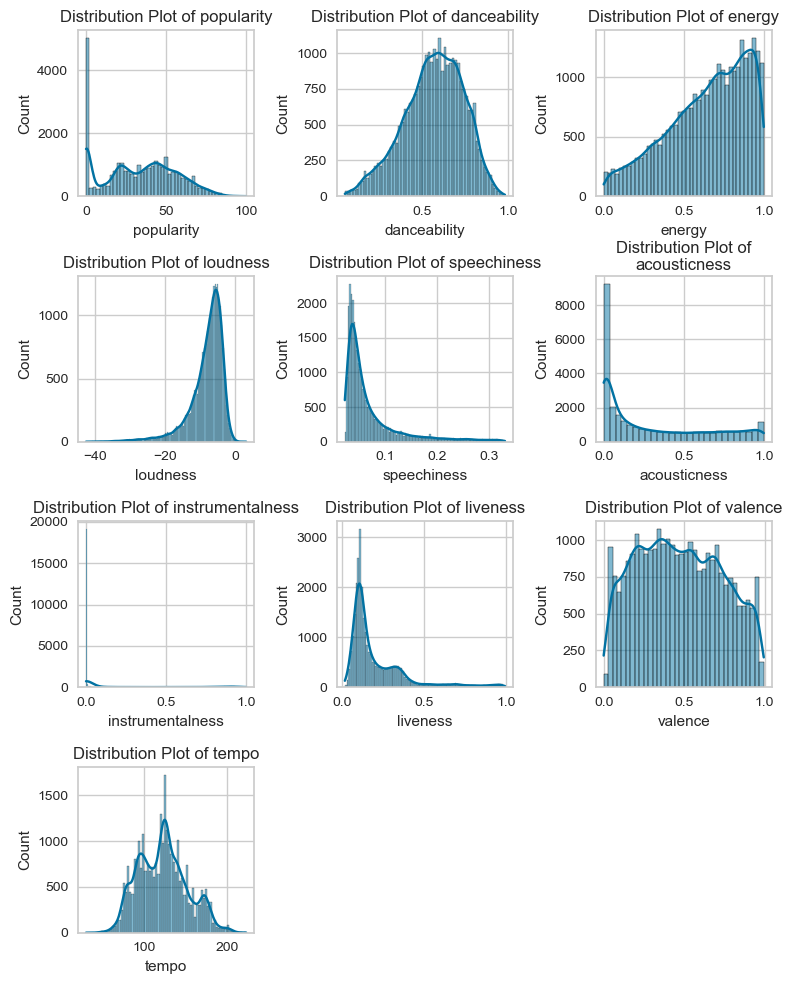

In [17]:
# prevent warnings from appearing
import warnings
warnings.simplefilter('always', category=UserWarning)

# get the number of rows and cols
n_cols = len(num_cols)
n_rows = int(np.ceil(n_cols / 3))

# set up the plot
fig, axes = plt.subplots(n_rows, 3, figsize=(8, 10))

# loop through the numeric columns and plot the distributions
for i, col in enumerate(num_cols):
    row_idx = i // 3
    col_idx = i % 3
    sns.histplot(data[col], ax=axes[row_idx, col_idx], kde=True)

    axes[row_idx, col_idx].set_title(f"Distribution Plot of {col}", wrap=True)
    axes[row_idx, col_idx].set_xlabel(col)

# format the plot
for i in range(n_cols, n_rows*3):
    fig.delaxes(axes.flatten()[i])

fig.tight_layout()

plt.show()

It looks like the distributions for danceability, energy, volume, liveness, valence, and tempo aren't normal, but it doesn't seem like they will cause issues with high correlation.  Danceability and valence had a semi-normal distribution with most of the songs centered on the middle of the scale. Popularity and tempo were more spread out.

However, there might be an issue with speechiness, liveness, acousticness, and instrumentalness. Since these features are so extremely skewed, they might not be great predictors for popularity since they might be very similar across popular and unpopular songs.

Let's do a correlation matrix. We will look at any correlations between 'popularity' and the other numerical problems. Even though our label is our new created column of is_popular, this should still be helpful because we are creating are is_popular label from the 'popularity' column. This will help us get a general sense of what features are correlated with popularity.

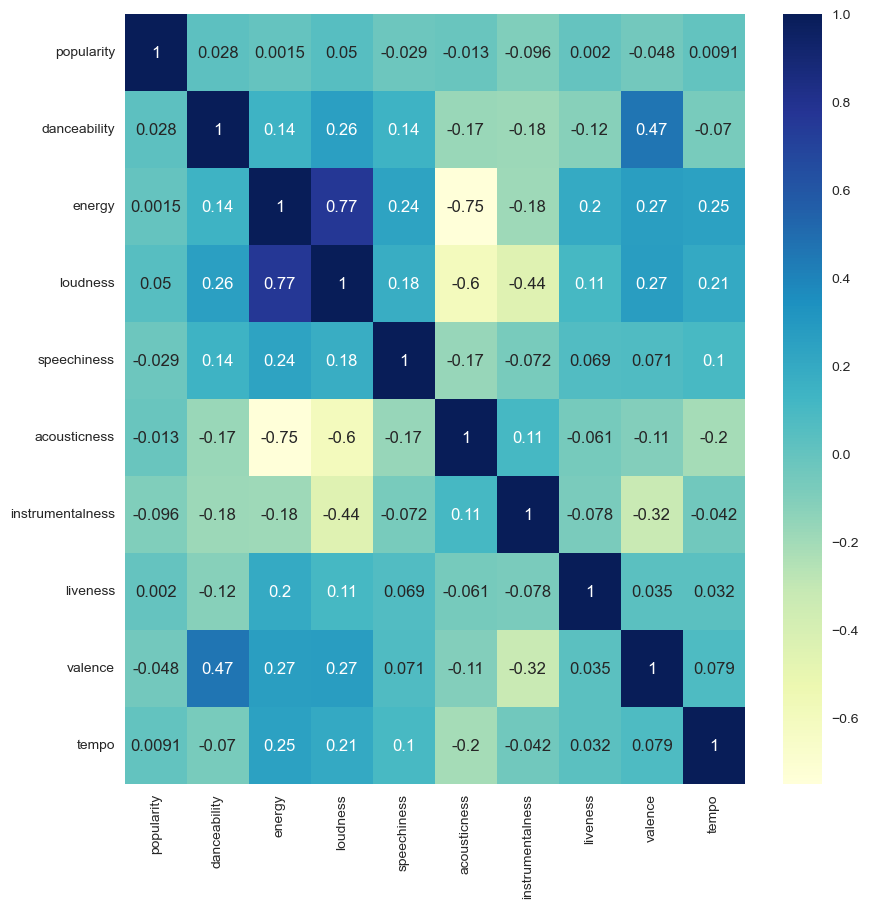

In [18]:
# create a correlation matrix for the numeric features
num_cols_corr = data.select_dtypes(include=['int64', 'float64'])
corr_data = num_cols_corr.corr()

fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corr_data, cmap="YlGnBu", annot=True)

plt.show()

There are high correlations between energy and acousticness, loudness and acousticness, and energy and loudness. The rest of the correlations are pretty low. According to the correlation matrix, no features are strongly correlated with popularity. The highest correlation with popularity is between popularity and instrumentalness with a correlation of -0.095. The highest correlation overall is between energy and loudness.

Let's create some scatterplots to visualize any correlations between features and any patterns between popular and unpopular songs.

In [19]:
# plot a scatterplot of loudness vs energy
fig1 = px.scatter(data, x="loudness", y="energy", color='is_popular', color_discrete_sequence=["blue", "teal"])
fig1.show()

First we compared energy and loudness, which had the highest correlation. The relationship appears to be exponential, but pretty similar for each popularity group. The main takeaway was that the popular songs seem to be more densely grouped in the top right while unpopular songs have greater scatter.

In [20]:
# plot a scatterplot of acousticness vs energy
fig2 = px.scatter(data, x="acousticness", y="energy", color='is_popular', color_discrete_sequence=["blue", "teal"])
fig2.show()

Energy and acousticness had a less apparent relationship, but once again the popular songs were more condensed to the far left and right while the unpopular songs stretch across the whole plot.


In [21]:
# plot a scatterplot of loudness vs loudness
fig3 = px.scatter(data, x="acousticness", y="loudness", color='is_popular', color_discrete_sequence=["blue", "teal"])
fig3.show()

We see a similar trend with loudness vs acousticness, where more popular songs are clustered to the top left of the plot and unpopular songs being distributed more widely than popular songs.

From these plots, it appears that there is great overlap between popular and unpopular songs with the features of acousticness, loudness, and energy, which had the highest correlations with one another. It still appears that it may be difficult to classify songs as unpopular or popular because of this overlap we see.

Now let's check the balance of the categorical features in our data.

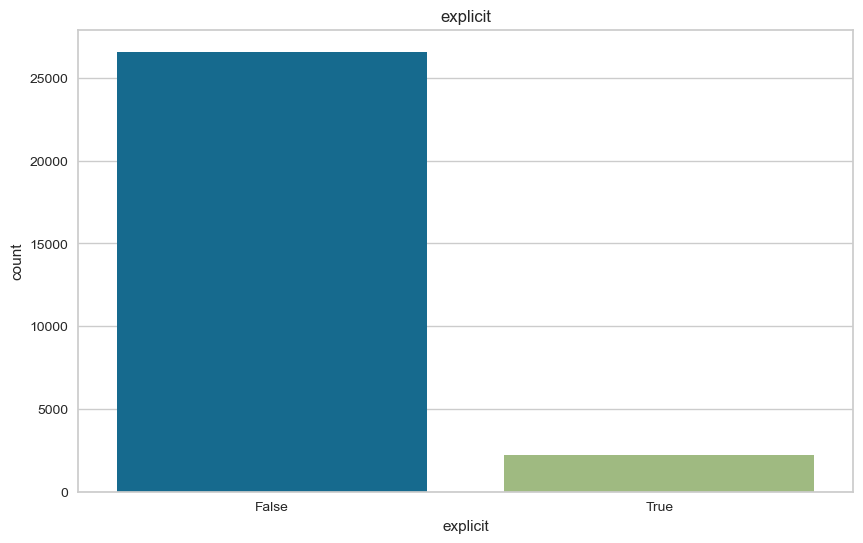

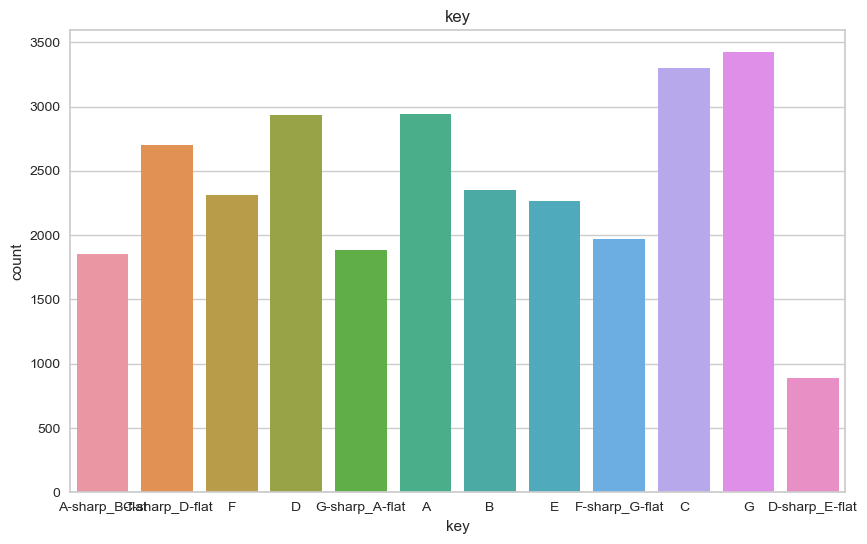

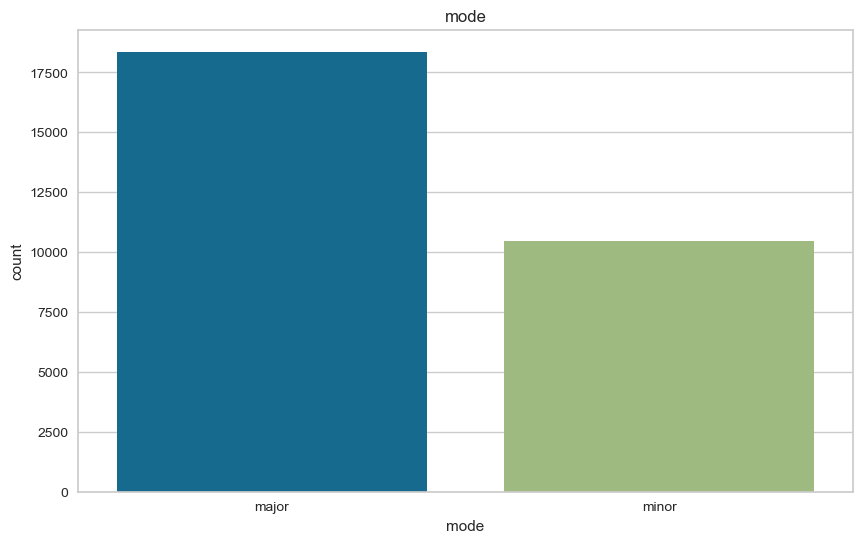

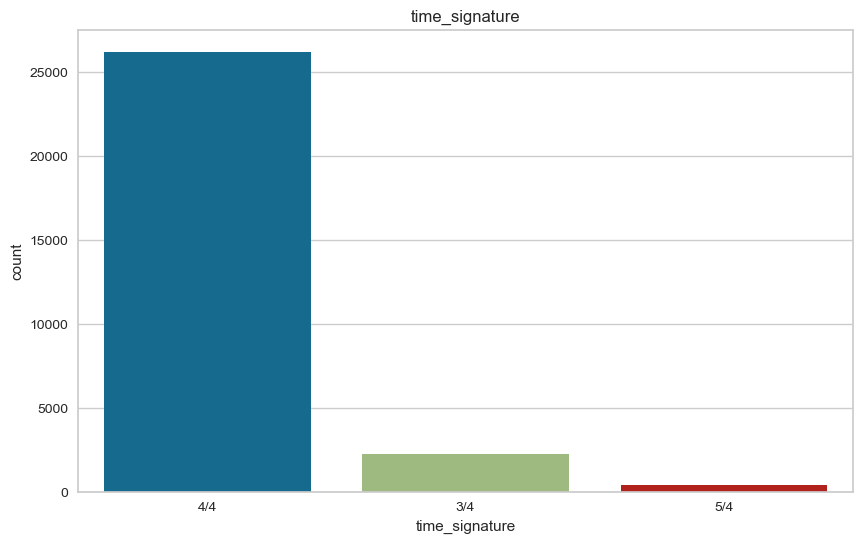

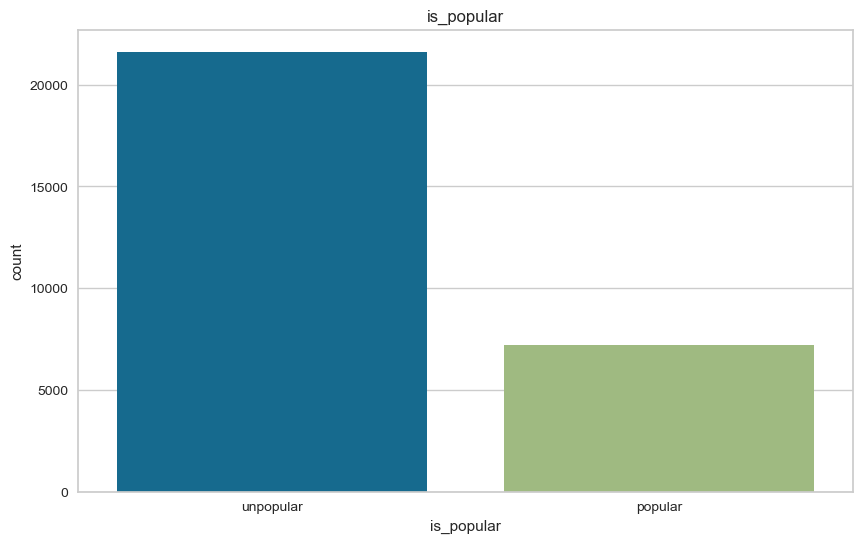

In [22]:
# loop through the categorical columns and plot the distributions
for column in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=column, data=data.loc[:,categorical_cols])
    plt.title(column)

Most of the songs in our data are not explicit, there is a pretty even distribution of key for our songs except for D Sharp being the lowest, most songs are in major key, and almost all have a 4/4 time signature. The distribution of genres in our data is fairly equal and most of our songs fall into the unpopular category. Let's see how these features affect a song's popularity. To do this, we will use the 'popularity' column even though this is not our true label. We are simply doing some exploratory analysis and it will be easier to compute correlations with quantitative features. Because we are getting our true label of popular/unpopular from the 'popularity' column, this should still be useful.

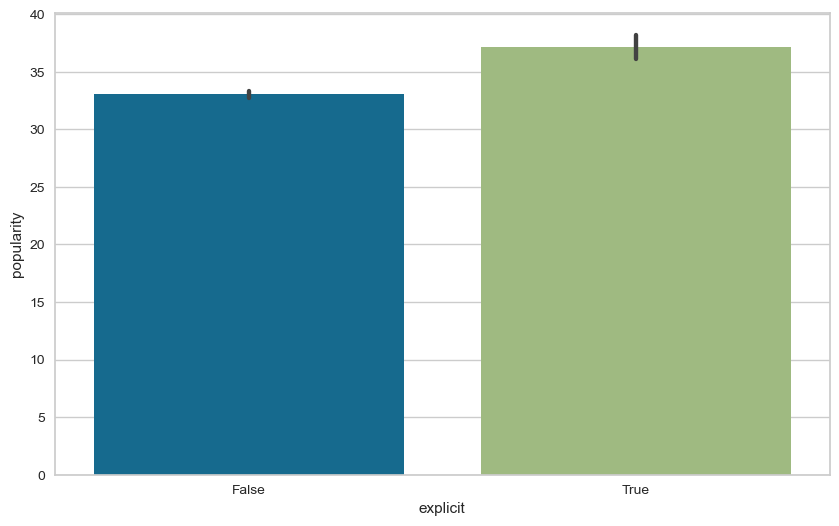

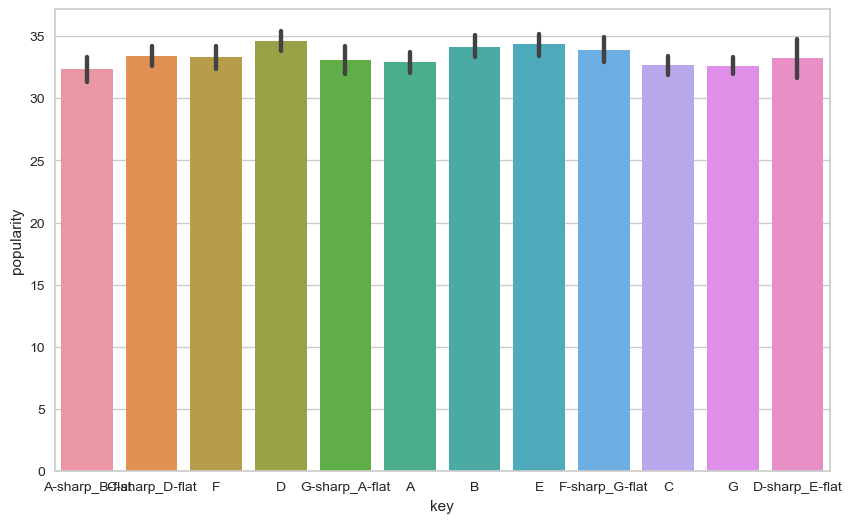

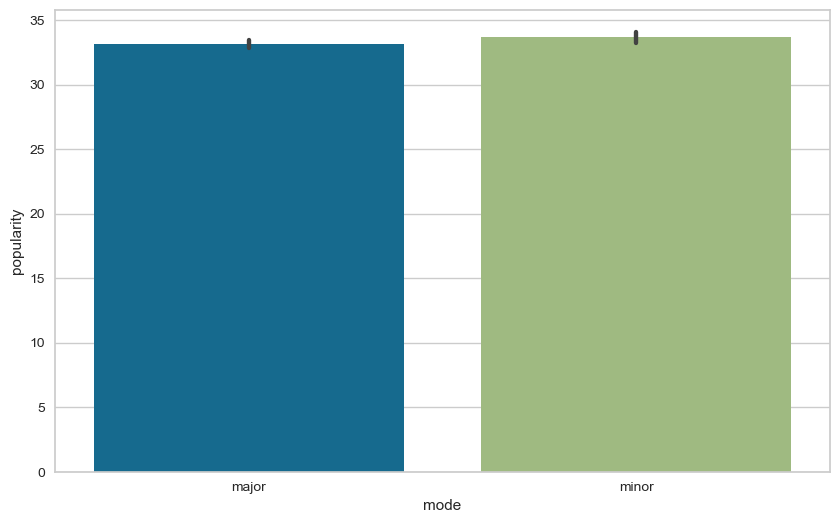

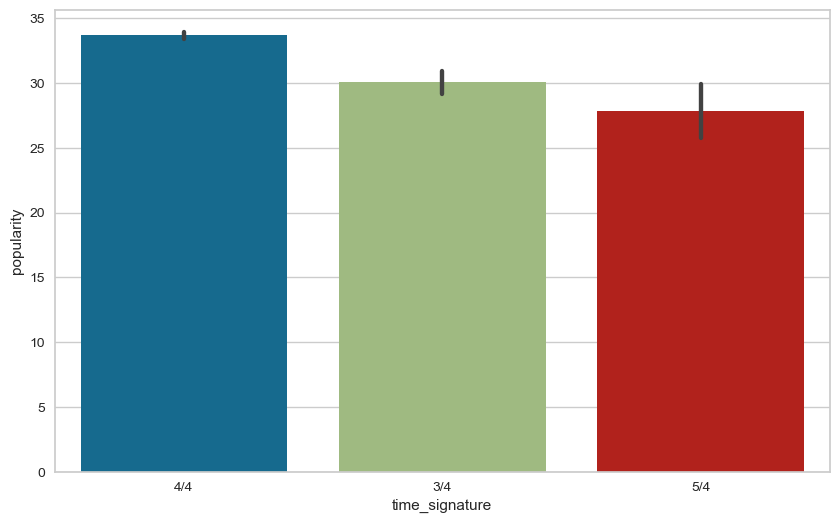

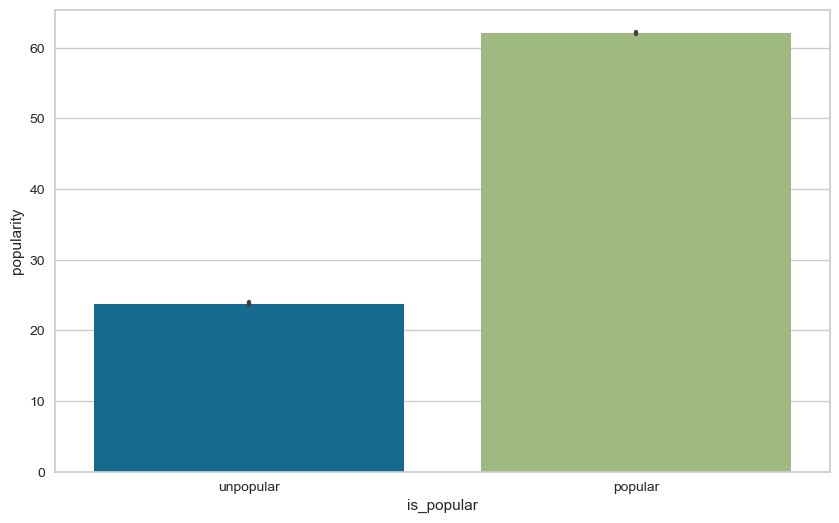

In [23]:
# loop through the categorical columns and plot the average popularity per category
for column in categorical_cols:
    dataset=data.copy()
    plt.figure(figsize=(10, 6))
    sns.barplot(x=column, y=dataset['popularity'], data=dataset, estimator=np.mean)
    plt.show()

It looks like explicit songs have a higher mean popularity score than clean songs, even though there are many more clean songs in our data. It looks like the key of a song and mode do not have that much effect on mean popularity score. Songs with 4/4 time signature have the highest average popularity, with 3/4 and 5/4 being lower and about the same. For the most part, it looks like there isn't that much of a difference in our categorical features between popular and unpopular songs, similarly to what we found when we visualized our numeric features.

From our exploratory analysis, it appears that no quantitative feature is very strongly correlated with song popularity. The distributions of the quantitative features appear strange, with many being very strongly skewed and showing strong overlap between popular and unpopular songs. It appears that our qualititave features also may not be strong predictors of popularity. Our categories appear fairly balanced as well and no features seems to be very indicative of popularity.

## Processing Data for Neural Network

As we have seen earlier, we have some categorical features in our data. We will one-hot encode our categorical columns so they can be used in our models and for better accuracy. It creates new (binary) columns that indicate the presence of each possible value from the original categorical data. Then we will split the data into training and test sets, holding out 33% of the data for our test set. This should be a good balance of enough data to train our model with but also avoid overfitting. We will also scale our data.

In [24]:
# one hot encode categorical features
one_hot_encoded_data = pd.get_dummies(data, columns = ['key', 'explicit', 'mode', 'time_signature', 'is_popular'])

# split into test/train data
X = one_hot_encoded_data.drop(['popularity', 'is_popular_popular', 'is_popular_unpopular'], axis = 1)
y = one_hot_encoded_data['is_popular_popular']
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.33, random_state=42)


# reshape the data for the model
X_train = np.array(train_X, dtype=np.float32)
X_test = np.array(test_X, dtype=np.float32)
y_train = tf.keras.utils.to_categorical(train_y).astype(np.float32)
y_test = tf.keras.utils.to_categorical(test_y).astype(np.float32)

# scale the numeric features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

y_train = tf.keras.utils.to_categorical(train_y).astype(np.float32)
y_test = tf.keras.utils.to_categorical(test_y).astype(np.float32)

## Neural Networks

We will use Tensorflow to create a fully connected neural network. We used the relu activation function to introduce nonlinearity to the model while also prioritizing efficiency. The last layer uses softmax as the activation function since this takes the final representation of the data input and outputs the classification prediction. We used the Adam optimizer because it adapts the learning rate during training to converge as quickly as possible and it also pairs well with relu. We used 250 neurons in each hidden layer and 20 epochs to improve accuracy as much as possible without overfitting and taking too long to train. Finally, we use the categorical crossentropy loss function because our task is a categorical classification one. We played around with different batch sizes and found that 20 was still large enough to avoid overly long training times while still being able to generalize to new data.


In [25]:
# construct model
model = tf.keras.models.Sequential([
    layers.Dense(250, input_shape = (28,), activation='relu', kernel_initializer='he_normal'),
    layers.Dense(250, activation='relu', kernel_initializer='he_normal'),
    layers.Dense(2, activation='softmax')
])

# get summary of model
model.summary()

# compile model using adam optimizer and categorical crossentropy loss function
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# parameters
n_epochs = 20
n_batch_size = 20

# train the model
history = model.fit(X_train,
                      y_train,
                      epochs=n_epochs,
                      batch_size=n_batch_size,
                      validation_data=(X_test, y_test))


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 250)               7250      
                                                                 
 dense_1 (Dense)             (None, 250)               62750     
                                                                 
 dense_2 (Dense)             (None, 2)                 502       
                                                                 
Total params: 70502 (275.40 KB)
Trainable params: 70502 (275.40 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
966/966 [==============================] - 3s 2ms/step - loss: 0.5790 - accuracy: 0.7319 - val_loss: 0.5513 - val_accuracy: 0.7429
Epoch 2/20
966/966 [==============================] - 2s 2ms/step - loss: 0.5408 - accuracy: 0.7511 - val_loss: 0.5469 - val_accuracy: 0.745

In [26]:
# display accuracy/loss

test_loss, test_accuracy = model.evaluate(X_test, y_test)
print('Test Accuracy:', test_accuracy)
print('Test Loss:', test_loss)

298/298 [==============================] - 1s 2ms/step - loss: 0.6112 - accuracy: 0.7313
Test Accuracy: 0.7313432693481445
Test Loss: 0.6111800074577332


The fully connected neural network had an overall test accuracy of about 73%. The model showed some improvement in accuracy after training, with an increase from 73% to almost 81% after 20 epochs. This is the highest training accuracy we were able to identify using this neural network. Our initial model stayed relatively stagnant at less than 75% accuracy but after increasing the number of epochs and decreasing the batch size we saw improvement. However even with this improvement in training accuracy, the model performs at 73% accuracy on the test data which is the accuracy that the model started with in training.

Because our fully connected neural network performed consistently at about 73% to 75% test accuracy even when tuning our model, we decided to try a convolutional neural network using Tensorflow to see if that would perform better.

We use 3 Conv1D layers and 2 MaxPooling1D layers. The Conv1D layer creates a convolution kernel that is convolved with the layer input over a single dimension to produce a tensor of outputs. Repeated application of the same filter to an input results in a map of activations called a feature map, indicating the locations and strength of a detected feature in an input. Max pooling is a pooling operation that selects the maximum element from the region of the feature map covered by the filter. After flattening the data in the neural network, we then use two Dense layers which do the learning.

We choose a relu activation function, he_normal kernel initializer, and softmax activation function for the last layer for the same reasons as stated above in our fully connected neural network. We choose neurons of 32 and 64 and our filters because we wanted to balance complexity and computational time, and we found that increasing the number of neurons did not yield significantly better results. We choose the Adam optimizer, loss function, batch size, and epochs for the same reasons as in our fully connected neural network.

In [27]:
# construct model
cnn = tf.keras.models.Sequential([
    layers.Conv1D(32, (3, ), activation='relu', input_shape=(28, 1)),
    layers.MaxPooling1D((2, )),
    layers.Conv1D(64, (3, ), activation='relu'),
    layers.MaxPooling1D((2, )),
    layers.Conv1D(64, (3, ), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu', kernel_initializer='he_normal'),
    layers.Dense(2, activation='softmax')
])

# summary of model
cnn.summary()

# compile model using adam optimizer and sparse categorical crossentropy loss function
cnn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# train model
history = cnn.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size = 20,
                    validation_data=(X_test, y_test))


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 26, 32)            128       
                                                                 
 max_pooling1d (MaxPooling1  (None, 13, 32)            0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 11, 64)            6208      
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 5, 64)             0         
 g1D)                                                            
                                                                 
 conv1d_2 (Conv1D)           (None, 3, 64)             12352     
                                                                 
 flatten (Flatten)           (None, 192)              

In [28]:
test_loss_cnn, test_accuracy_cnn = cnn.evaluate(X_test, y_test)
print('Test Accuracy:', test_accuracy_cnn)
print('Test Loss:', test_loss_cnn)

298/298 [==============================] - 1s 2ms/step - loss: 0.5416 - accuracy: 0.7426
Test Accuracy: 0.7425898909568787
Test Loss: 0.541610836982727


Our CNN and fully connected neural network appear to perform pretty similarly, with the CNN having a test accuracy of about 74%. However, during training, the CNN never reached 80% accuracy and only increased from about 75% to  76% accuracy after 20 epochs. We found that when increasing the number of epochs, the CNN did not achieve 80% accuracy either. Because the CNN performed marginally better than the fully connected neural network and had less of a discrepancy betweeen training and test accuracy, it appears to be a slightly better model. However, on the test data, it actually performs worse than it did at the beginning of training.

## Data Processing for Other Models

We wanted to test another type of model on our data to see if we would be able to get any higher accuracy. First, we need to process our data differently for Logistic Regression and Support Vector Machines, because one-hot encoded data is a problem for these models due to the fact that so many new columns are created. Very high-dimensional data that is created from one-hot encoding means that these models are very computationally expensive and unable to be run in our project currently.

So, we will label encode our categorical variables for Support Vector Machines and Logistic Regression and prep the data in the same way as for the neural network.

In [29]:
# create the label encoder
le = LabelEncoder()

# create the label encoded data and split it into train and test sets. we set the random state to be the same for all train test splits
# so we know our results are from the same data.
label_encoded_data = data.copy()
label_encoded_data['is_popular'] = le.fit_transform(label_encoded_data['is_popular'])
label_encoded_data['explicit'] = le.fit_transform(label_encoded_data['explicit'])
label_encoded_data['key'] = le.fit_transform(label_encoded_data['key'])
label_encoded_data['mode'] = le.fit_transform(label_encoded_data['mode'])
label_encoded_data['time_signature'] = le.fit_transform(label_encoded_data['time_signature'])

# create X and y data
X_le = label_encoded_data.drop(['popularity', 'is_popular'], axis=1)
y_le = label_encoded_data['is_popular']

# split into train and test sets
train_Xle, test_Xle, train_yle, test_yle = train_test_split(X_le, y_le, test_size=0.33, random_state=42)

# scale the numeric features
scaler = StandardScaler()
train_Xle = scaler.fit_transform(train_Xle)
test_Xle = scaler.transform(test_Xle)

## Random Forest

We will first attempt a Random Forest Classifier model. We will tune our optimal hyperparameters using GridSearchCV from Scikit-learn. How this works is we define a grid space with the different hyperparameters that we want to test out. GridSearchCV then fits the model with every combination of hyperparameters to find the one that performs the best. Then, we will use these hyperparameters in our model.

In [30]:
# create a RFC model
rf = RandomForestClassifier()

# define hyperparameters to test
grid_space={'max_depth':[3,5,10,None],
              'n_estimators':[10,100,200],
              'max_features':[1,3,5,7],
              'min_samples_leaf':[1,2,3],
              'min_samples_split':[1,2,3]
           }

# fit each hyperparameter combination to determine the best one
grid = GridSearchCV(rf,param_grid=grid_space,cv=3,scoring='accuracy')
rfc_grid = grid.fit(X_train,y_train)

# print best hyperparameters and score
print('Best hyperparameters are: '+str(rfc_grid.best_params_))
print('Best score is: '+str(rfc_grid.best_score_))

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning:


432 fits failed out of a total of 1296.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
432 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1144, in wrapper
    estimator._validate_params()
  File "/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 637, in _validate_params
    validate_parameter_constraints

Best hyperparameters are: {'max_depth': None, 'max_features': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best score is: 0.7712022367194781


Here we see that GridSearchCV has told us our best hyperparameters so we will use them in our model.

In [31]:
# create RFC model
rfc = RandomForestClassifier(max_depth = None, max_features = 3,
                             min_samples_leaf = 1, min_samples_split = 2,
                             n_estimators = 200)

# fit model
rfc.fit(X_train, y_train)

# score model on training and test data
rfc_score = rfc.score(X_test, y_test)
rfc_preds = rfc.predict(X_test)

y_train_pred = rfc.predict(X_train)
rfc_train_score = rfc.score(X_train, y_train)

# print training and evaluation score
print(f'The training score is {rfc_train_score}.')
print(f'The evaluation score is {rfc_score}.')

The training score is 0.9958061509785647.
The evaluation score is 0.7825310069371453.


Our accuracy for the test data using RFC is comparable to our neural network performance and slightly better with an evaluation score of about 78%. However, it is very overfit as our training score is 99%, which is not good; at the moment, our neural networks still seem to be the best models for this classification task, but we will move forward with comparing Support Vector Machines and Logistic Regression to see if we can get a better evaluation score.

## Support Vector Machines

We will also use GridSearchCV to tune hyperparameters for our Support Vector Machines model.

In [32]:
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}

grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)

# fitting the model for grid search
grid.fit(train_Xle, train_yle)

# print best parameter after tuning
print(grid.best_params_)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.751 total time=  24.8s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.751 total time=  26.1s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.751 total time=  24.4s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.751 total time=  24.8s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.751 total time=  24.9s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.751 total time=  15.3s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.751 total time=  15.1s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.751 total time=  15.1s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.751 total time=  15.1s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.751 total time=  15.1s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.751 total time=  10.4s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.710 total time=  46.1s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.728 total time=  50.1s
[CV 4/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.709 total time=  45.8s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.723 total time=  44.9s
[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.702 total time= 4.7min
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.707 total time= 4.6min
[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.716 total time= 5.2min
[CV 4/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.695 total time= 8.8min
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.706 total time= 5.5min
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.753 total time= 7.4min
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.749 total time= 7.3min
[CV 3/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.751 total time= 6.6min
[CV 4/5] END ....C=1000, gam

Grid Search tells us our best parameters for C, gamma, and kernel, so we will use these to train our support vector machine model and test it.

In [33]:
# create SVM model and train
svc = SVC(kernel='rbf', C=1, gamma=1)
svc.fit(train_Xle, train_yle)

# score model on training and test data
score = svc.score(test_Xle, test_yle)
svm_train_score = svc.score(train_Xle, train_yle)
svm_preds = svc.predict(test_Xle)

# print scores
print(f'The training score is {svm_train_score}.')
print(f'The evaluation score is {score}.')

The training score is 0.8830899865382624.
The evaluation score is 0.7591969728820686.


Unfortunately, the Support Vector Machines model also performs similarly to our neural network and RFC with a final test accuracy score of about 76%. This model appears to be overfit as well, but not to the degree of the random forest. It still appears that our neural networks are the best models, but we will move forward with logistic regression to see if we are able to get a better test accuracy score.

## Logistic Regression

Finally, we will train one more Logistic Regression model just to make sure there aren't other models that will give us a better accuracy score. Once again, we first tune the hyperparameters.

In [34]:
# define models and parameters
lr = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]

# define grid search and fit model to each parameter combination
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=lr, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(train_Xle, train_yle)

# summarize best results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.750768 using {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}


We see our best values for C, penalty, and solver, so we will use these parameters to train a logistic regression model.

In [35]:
# define model
logisticRegr = LogisticRegression( C=0.01, penalty= 'l2',
                                  solver='newton-cg')

# fit model and score it on train and test data
logisticRegr.fit(train_Xle, train_yle)
lr_preds = logisticRegr.predict(test_Xle)
lr_score = logisticRegr.score(test_Xle, test_yle)
lr_train_score = logisticRegr.score(train_Xle, train_yle)

# print scores
print(f'The training score is {lr_train_score}.')

print(f'The evaluation score is {lr_score}.')

The training score is 0.7508543025784405.
The evaluation score is 0.7487912549926424.


Our logistic regression model performs as we expected compared to our other models with a test accuracy of about 75% and it is not overfit. Currently, the logistic regression model seems to be the best model as it is not overfit and it still has a relatively good test accuracy compared to the other models.


So far, all of our models perform at about the same test accuracy. This still poses a problem because if we randomly select a song and say that it is unpopular, we would have about a 70% chance of getting it right because about 70% of the songs in our dataset are unpopular. We can check this by referring back to our exploratory analysis plot that shows the distribution of popular and unpopular songs. So none of our models are performing very well above random chance.

## Kernel PCA to Create New Features

In attempt to get our accuracy score up, we will perform Kernel PCA on our data to hopefully create better features to train on our models and make them more accurate.

Kernel PCA is a nonlinear dimensionality reduction method. It applies a nonlinear mapping function to the data before applying PCA, which lets it capture more complex and nonlinear relationships between the data. We choose n_components = 2 because otherwise our runtime would crash. We thought that since Kernel PCA can be more robust to outliers and noise in the data and it captures global structures in the data, that it might help us classify songs better if we use the new features that are created by it.

In [36]:
# define the KPCA, fit and transform our data based on new features
kpca = KernelPCA(n_components = 2, kernel = 'rbf')
train_Xle = kpca.fit_transform(train_Xle)
test_Xle = kpca.transform(test_Xle)

# create and fit Logistic Regression model on the new features
lr_kpca = LogisticRegression(C=0.01, penalty= 'l2',
                                  solver='newton-cg')
lr_kpca.fit(train_Xle, train_yle)

LogisticRegression(C=0.01, solver='newton-cg')

In [37]:
# score model on the test data
y_pred = lr_kpca.predict(test_Xle)
accuracy_score(test_yle, y_pred)

0.748370821946605

Unfortunately, even after applying Kernel PCA, we still get the pretty much the same accuracy with our Logistic Regression model.

## Discussion on Popularity Classification

All of our models (Neural Network, Random Forest, Support Vector Machines, and Logistic Regression) perform at around the same test accuracy of around 75%. Furthermore, after applying Kernel PCA, we still get the same results.

If we inspect our neural network training process closer, we see that the model doesn't actually improve much over the training process. The fully connected model starts at an accuracy of around 73% and then improves to about 80%, and then performs at about 73% on the test data. The convolutional neural network starts at an accuracy of almost 75% and only improves to 76%. If we consider the actual distribution of popular songs in our dataset, we see that in the exploratory analysis section above, there are roughly 70% unpopular songs and 30% popular songs in the data. Therefore, all of our models are performing at a little above random chance level.

Looking back at the exploratory visualizations, many numeric features show high skewness, which might not make them good predictors since most of the songs in our data would have the same or similar values. This would also go for categorical variables like time signature, where a majority of our data is in 4/4 time signature.

We conclude that the popularity of songs depends on outside factors rather than just the song's attributes itself. For example, if a global phenomenon like Taylor Swift releases a very slow, quiet, and sad song, it is likely to reach popular status. If Taylor Swift also releases a fast, energetic, and happy song, it is also likely to become popular.

# Genre Classification Problem

Because we weren't able to successfully predict a song's popularity based on a song's inherent attributes, we will now turn to another problem of classifying a song's genre based on its attributes. It seems reasonable that songs of a certain genre will have similar characteristics to one another, and that different genres would be different enough from each other to successfully classify them. For example, pop songs have a very distinct sound from rock songs; rock songs typically use live instruments and are more "intense" sounding than pop songs which usually use sound like they are produced using electronic beats. We already know the basics of our dataset from our earlier processing, so we will just process the data in a way that suits our current genre problem and create more visualizations.

## Data Processing and Exploration

We will first create a new dataframe for our genre classification problem. Much of our data processing will be similar to what we did above.

In [38]:
# create new dataset for genre
genre_data = pd.read_csv('https://github.com/angelafan03/16bproject/blob/main/spotify_tracks.csv?raw=true')

We will still drop columns that aren't song features that we want to use in our models.

In [39]:
# drop unneeded columns
genre_data = genre_data.drop(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name', 'duration_ms'], axis=1)

The label we will use for our models will be the track_genre column. Let's inspect this column a bit more by looking at exactly how many unique genres are in the dataset.


In [40]:
# get all unique genres
genre_data.track_genre.unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

There are over 100 different genres in this dataset. There are many specific and niche genres such as "grindcore" and "hardstyle." There are also many columns which are much more vague, such as "romance" and "sad". Pop songs, rock songs, and indie songs could fall into these categories. There are also many genres which might overlap with one another, such as "rock" and "rock-n-roll" and "kids" and "children." Because there are so many genres and many which are very specific, very vague, and overlapping, we will take a subset of these genres to work with in our project.

There are over 100 genres in this dataset, but we want to try to reduce the number of categories to make classification more doable. We will group similar genres together in order to create a new subset of data. We will use the overarching genres of pop, rock, classical, hip-hop, and EDM as these are all very distinct and recognizable, and all are relatively popular worldwide.

In [41]:
# create dictionary that maps subgenres to main genres
genre_mapping = {'alt-rock':'rock'
                    ,'hard-rock':'rock'
                    ,'punk-rock':'rock'
                    ,'rock-n-roll':'rock'
                    ,'rock':'rock'
                    ,'dub':'edm'
                    ,'dubstep':'edm'
                    ,'edm':'edm'
                    ,'electronic':'edm'
                    ,'techno':'edm'
                    ,'j-pop':'pop'
                    ,'k-pop':'pop'
                    ,'pop':'pop'
                    ,'classical':'classical'
                    ,'hip-hop':'hip-hop'
                    }

In [42]:
# apply the dictionary to the track_genre column
genre_data = genre_data.assign(track_genre = genre_data.track_genre.map(genre_mapping))

In [43]:
# query the dataset to only have rock, edm, pop, classical, and hip-hop genres
genre_data = genre_data.query("track_genre == 'rock' | track_genre == 'edm' | track_genre == 'pop' | track_genre == 'classical' | track_genre == 'hip-hop'")

Let's look at how many features our data has now.

In [44]:
genre_data.shape

(15000, 15)

We will now do the same processing on our new genre dataset as before, getting only tracks that are songs, recoding categorical columns so we can have clearer visualizations, and other processing.

In [45]:
# filter out rows with speechiness greater than 0.33
genre_data = genre_data[genre_data['speechiness'] <= 0.33]

In [46]:
# change the values of the discrete numeric columns from numbers to strings that represent the values
genre_data['mode'] = genre_data['mode'].replace({0: 'minor', 1: 'major'})
genre_data['key'] = genre_data['key'].replace({0: 'C', 1: 'C-sharp_D-flat', 2: 'D', 3: 'D-sharp_E-flat', 4: 'E', 5: 'F',
                               6: 'F-sharp_G-flat', 7: 'G', 8: 'G-sharp_A-flat', 9: 'A', 10: 'A-sharp_B-flat', 11: 'B'})

In [47]:
# remove rows where the time signature is less than 3 or greater than 7
genre_data = genre_data.loc[genre_data['time_signature'] >= 3]
genre_data = genre_data.loc[genre_data['time_signature'] <= 7]

# recode the values of time_signature from numeric to string values
genre_data['time_signature'] = genre_data['time_signature'].replace({3: '3/4', 4: '4/4', 5: '5/4', 6: '6/4', 7: '7/4'})

Let's make sure we still have enough rows to work with in our data after this initial processing.

In [48]:
genre_data.shape

(14615, 15)

We went from over 100,000 rows to around 15,000. Certain genres, like rock and edm, have over 5,000 samples while classical and hip-hop have around 1,000.

Now, we will inspect our quantitative data. Let's get some summary statistics grouped by our label.

In [49]:
genre_data.groupby("track_genre").describe() #summary stats grouped by genre

popularity                                                      \
                 count       mean        std  min   25%   50%   75%    max   
track_genre                                                                  
classical        950.0  12.910526  18.067996  0.0   0.0   3.0  24.0   79.0   
edm             4867.0  40.088145  20.527433  0.0  30.5  44.0  53.0   98.0   
hip-hop          924.0  37.970779  32.519387  0.0   0.0  58.0  63.0   99.0   
pop             2895.0  49.122971  25.737607  0.0  38.0  56.0  68.0  100.0   
rock            4979.0  33.651135  26.951033  0.0   1.0  36.0  56.0   96.0   

            danceability                                                      \
                   count      mean       std     min      25%    50%     75%   
track_genre                                                                    
classical          950.0  0.379776  0.143807  0.0713  0.28500  0.376  0.4760   
edm               4867.0  0.616929  0.141500  0.1590  0.51800  0.627  0.7230   
hip-hop            924.0  0.737581  0.118355  0.3290  0.67775  0.753  0.8225   
pop               2895.0  0.610744  0.137034  0.1740  0.51950  0.620  0.7100   
rock              4979.0  0.523742  0.135692  0.1120  0.43200  0.529  0.6210   

                    energy                                                \
               max   count      mean       std       min     25%     50%   
track_genre                                                                
classical    0.797   950.0  0.188370  0.177302  0.000756  0.0535  0.1420   
edm          0.958  4867.0  0.732406  0.161965  0.025900  0.6330  0.7530   
hip-hop      0.964   924.0  0.688340  0.145653  0.298000  0.5730  0.6985   
pop          0.935  2895.0  0.659673  0.198747  0.037800  0.5330  0.6760   
rock         0.922  4979.0  0.712963  0.206901  0.052900  0.5570  0.7550   

                            loudness                                         \
                 75%    max    count       mean       std     min       25%   
track_genre                                                                   
classical    0.24875  0.953    950.0 -20.245685  7.386035 -41.531 -24.84675   
edm          0.85900  0.999   4867.0  -6.356388  2.954185 -30.016  -7.94200   
hip-hop      0.79925  0.994    924.0  -5.926539  2.021519 -15.918  -7.10225   
pop          0.82200  0.995   2895.0  -6.486368  3.016303 -22.655  -8.09900   
rock         0.89000  0.998   4979.0  -6.975315  3.085815 -23.746  -8.72150   

                                      speechiness                              \
                 50%       75%    max       count      mean       std     min   
track_genre                                                                     
classical   -20.5730 -15.54575 -1.383       950.0  0.047377  0.021495  0.0262   
edm          -5.8610  -4.37150  0.910      4867.0  0.071968  0.056108  0.0234   
hip-hop      -5.8665  -4.45700 -0.079       924.0  0.112599  0.073334  0.0241   
pop          -6.1130  -4.34950  1.023      2895.0  0.069005  0.055304  0.0227   
rock         -6.2630  -4.75600  1.023      4979.0  0.056529  0.041079  0.0230   

                                              acousticness            \
                  25%     50%      75%    max        count      mean   
track_genre                                                            
classical    0.036600  0.0423  0.05010  0.239        950.0  0.918941   
edm          0.039600  0.0509  0.07580  0.330       4867.0  0.122112   
hip-hop      0.054875  0.0911  0.15325  0.327        924.0  0.190645   
pop          0.034250  0.0474  0.08015  0.326       2895.0  0.298876   
rock         0.032350  0.0415  0.06285  0.316       4979.0  0.211157   

                                                                 \
                  std       min      25%     50%     75%    max   
track_genre                                                       
classical    0.145032  0.000033  0.91825  0.9750  0.9910  0.996   
edm       

Each genre has between 900-8,000 songs. The average popularity of these genres range between 12.9 and 47.0, with classical having the least popularity on Spotify and pop having the most popularity. Classical also has the lowest energy while rock has the highest. Classical also has the lowest average danceability and pop has the highest. From the summary statistics, it looks like instrumentalness and acousticness might be good predictors of genre because they showed a lot of variation between genres. Other features like liveness look like they might not be because the mean values for each genre are very close to one another. In general, the classical music genre has the biggest differences from the other genres.

Now, we will visualize a stacked bar plot to better and clearly see what the differences in features are for our genres.

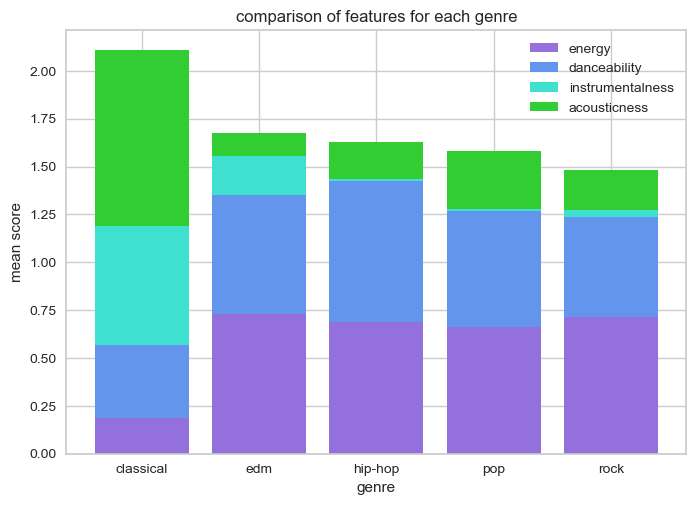

In [50]:
# stacked bar plot

stats = genre_data.groupby("track_genre").describe()

# x is the genre
# y are the stacked bars for the mean numeric values
x = ['classical', 'edm', 'hip-hop', 'pop',  'rock']
y1=stats['energy']['mean']
y2=stats['danceability']['mean']
y3=stats['instrumentalness']['mean']
y4=stats['acousticness']['mean']

# style the plot
plt.bar(x, y1, color='mediumpurple')
plt.bar(x, y2, bottom=y1, color='cornflowerblue')
plt.bar(x, y3, bottom=y1+y2, color='turquoise')
plt.bar(x, y4, bottom=y1+y2+y3, color='limegreen')
plt.xlabel("genre")
plt.ylabel("mean score")
plt.legend(["energy", "danceability", "instrumentalness", "acousticness"])
plt.title("comparison of features for each genre")
plt.show()

## Prepare the Data for Neural Network

Now we will split the data into training and test sets and make sure it is ready to be used in our models.

In [51]:
# one hot encode categorical features
one_hot_encoded_data_genre = pd.get_dummies(genre_data, columns = ['key', 'explicit', 'mode', 'time_signature'])

# label encode the categorical label as numeric
le = LabelEncoder()
one_hot_encoded_data_genre['track_genre'] = le.fit_transform(genre_data['track_genre'])

# split into test/train data
X_genre = one_hot_encoded_data_genre.drop(['track_genre'], axis=1)
y_genre = one_hot_encoded_data_genre['track_genre']
train_X_genre, test_X_genre, train_y_genre, test_y_genre = train_test_split(X_genre, y_genre, test_size=0.33, random_state=42)

# reshape the data for the model
X_train_g = np.array(train_X_genre, dtype=np.float32)
X_test_g = np.array(test_X_genre, dtype=np.float32)
y_train_g = tf.keras.utils.to_categorical(train_y_genre).astype(np.float32)
y_test_g = tf.keras.utils.to_categorical(test_y_genre).astype(np.float32)

# scale the numeric features
scaler_g = StandardScaler()
X_train_g = scaler_g.fit_transform(X_train_g)
X_test_g = scaler_g.transform(X_test_g)


## Neural Network


Similarly to our popularity classification model, we will use Tensorflow to create a fully connected neural network. We used the relu activation function to introduce nonlinearity to the model while also prioritizing efficiency. The last layer uses softmax as the activation function since this takes the final representation of the data input and outputs the classification prediction. We used the Adam optimizer because it adapts the learning rate during training to converge as quickly as possible and it also pairs well with relu. We used 250 neurons in each hidden layer and 20 epochs to improve accuracy as much as possible without overfitting and taking too long to train. Finally, we use the categorical crossentropy loss function because our task is a categorical classification one. We played around with different batch sizes and found that 20 was still large enough to avoid overly long training times while still being able to generalize to new data.

In [52]:
# construct model
fnn_genre = tf.keras.models.Sequential([
    layers.Dense(250, input_shape = (29,), activation='relu', kernel_initializer='he_normal'),
    layers.Dense(250, activation='relu', kernel_initializer='he_normal'),
    layers.Dense(5, activation='softmax')
])

# get summary of model
fnn_genre.summary()

# compile model using adam optimizer and categorical crossentropy loss function
fnn_genre.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# parameters
n_epochs = 20
n_batch_size = 20

# train the model
history = fnn_genre.fit(X_train_g,
                      y_train_g,
                      epochs=n_epochs,
                      batch_size=n_batch_size,
                      validation_data=(X_test_g, y_test_g))


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 250)               7500      
                                                                 
 dense_6 (Dense)             (None, 250)               62750     
                                                                 
 dense_7 (Dense)             (None, 5)                 1255      
                                                                 
Total params: 71505 (279.32 KB)
Trainable params: 71505 (279.32 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
490/490 [==============================] - 2s 2ms/step - loss: 0.9411 - accuracy: 0.6170 - val_loss: 0.8679 - val_accuracy: 0.6481
Epoch 2/20
490/490 [==============================] - 1s 2ms/step - loss: 0.8013 - accuracy: 0.6765 - val_loss: 0.8062 - val_accuracy: 0.6

In [53]:
# display accuracy/loss

test_loss, test_accuracy = fnn_genre.evaluate(X_test_g, y_test_g)
print('Test Accuracy:', test_accuracy)
print('Test Loss:', test_loss)


151/151 [==============================] - 0s 1ms/step - loss: 0.8980 - accuracy: 0.7172
Test Accuracy: 0.7171884775161743
Test Loss: 0.8980292081832886


We see that the training process for our fully connected neural network appears much better already compared to in our popularity problem. Our test accuracy is almost 72%, but it is overall learning much more and doing much better than our popularity neural network. This is because for our popularity problem, the random chance of predicting a song as unpopular was 70%. However, this is not the case for our current genre problem, and the model is performing well above random chance.

We also used created a 1D CNN. For our parameters such as number of layers, neurons, batch size, etc., we use the same logic as in our previous CNN to set them.

In [54]:
# construct model
cnn_genre = tf.keras.models.Sequential([
    layers.Conv1D(32, (3, ), activation='relu', input_shape=(29, 1)),
    layers.MaxPooling1D((2, )),
    layers.Conv1D(64, (3, ), activation='relu'),
    layers.MaxPooling1D((2, )),
    layers.Conv1D(64, (3, ), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu', kernel_initializer='he_normal'),
    layers.Dense(5, activation='softmax')
])

# summary of model
cnn_genre.summary()

# compile model using adam optimizer and sparse categorical crossentropy loss function
cnn_genre.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# train model
history = cnn_genre.fit(X_train_g,
                    y_train_g,
                    epochs=20,
                    batch_size = 20,
                    validation_data=(X_test_g, y_test_g))


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 27, 32)            128       
                                                                 
 max_pooling1d_2 (MaxPoolin  (None, 13, 32)            0         
 g1D)                                                            
                                                                 
 conv1d_4 (Conv1D)           (None, 11, 64)            6208      
                                                                 
 max_pooling1d_3 (MaxPoolin  (None, 5, 64)             0         
 g1D)                                                            
                                                                 
 conv1d_5 (Conv1D)           (None, 3, 64)             12352     
                                                                 
 flatten_1 (Flatten)         (None, 192)              

In [55]:
# display accuracy/loss

test_loss2, test_accuracy2 = cnn_genre.evaluate(X_test_g, y_test_g)
print('Test Accuracy:', test_accuracy2)
print('Test Loss:', test_loss2)

151/151 [==============================] - 0s 2ms/step - loss: 0.7736 - accuracy: 0.7224
Test Accuracy: 0.7223719954490662
Test Loss: 0.7735785841941833


It appears that our CNN performs slightly better than the fully connected neural network with a test accuracy of about 72%. It also appears to be less overfit and have a better learning process.

## Prepare the Data for Other Models

Once again, we just want to compare the performance of other models with our neural networks. We label encode our data for Logistic Regression and Support Vector Machines, similarly to how we did before in popularity classification.

In [56]:
# create the label encoder and encode all categorical columns numerically
le= LabelEncoder()
label_encoded_data_g = genre_data.copy()
label_encoded_data_g['track_genre'] = le.fit_transform(label_encoded_data_g['track_genre'])
label_encoded_data_g['explicit'] = le.fit_transform(label_encoded_data_g['explicit'])
label_encoded_data_g['key'] = le.fit_transform(label_encoded_data_g['key'])
label_encoded_data_g['mode'] = le.fit_transform(label_encoded_data_g['mode'])
label_encoded_data_g['time_signature'] = le.fit_transform(label_encoded_data_g['time_signature'])

# separate data into X (features) and y (label)
X_le_g = label_encoded_data_g.drop(['track_genre'], axis=1)
y_le_g = label_encoded_data_g['track_genre']

# perform a train test split
train_Xle_g, test_Xle_g, train_yle_g, test_yle_g = train_test_split(X_le_g, y_le_g, test_size=0.33, random_state=42)

## Random Forest Classifier

As we did previously, we tune our hyperparameters for all of our following models using GridSearchCV

In [57]:
# create the model
rf = RandomForestClassifier()

# define parameters we want to test
grid_space={'max_depth':[3,5,10,None],
              'n_estimators':[10,100,200],
              'max_features':[1,3,5,7],
              'min_samples_leaf':[1,2,3],
              'min_samples_split':[1,2,3]
           }


from sklearn.model_selection import GridSearchCV

# fit each parameter combination and return the ones that give best accuracy
grid = GridSearchCV(rf,param_grid=grid_space,cv=3,scoring='accuracy')
model_grid = grid.fit(X_train_g,y_train_g)

print('Best hyperparameters are: '+str(model_grid.best_params_))
print('Best score is: '+str(model_grid.best_score_))

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning:


432 fits failed out of a total of 1296.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
432 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1144, in wrapper
    estimator._validate_params()
  File "/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 637, in _validate_params
    validate_parameter_constraints

Best hyperparameters are: {'max_depth': None, 'max_features': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best score is: 0.6415441176470589


In [58]:
# create the model with best parameters
rfc_genre = RandomForestClassifier(max_depth = None, max_features = 7,
                             min_samples_leaf = 1,
                             min_samples_split = 2,
                             n_estimators = 200)

# train the model
rfc_genre.fit(X_train_g, y_train_g)

# test the model and get training and test scores
rfc_score = rfc_genre.score(X_test_g, y_test_g)
rfc_preds = rfc_genre.predict(X_test_g)

rfc_train_score = rfc_genre.score(X_train_g, y_train_g)

print(f'The training score is {rfc_train_score}.')
print(f'The evaluation score is {rfc_score}.')

The training score is 0.9853962418300654.
The evaluation score is 0.6670122330499689.


Our random forest model, similarly to in the popularity classification, is very overfit. It also does not perform as well as the neural networks on the test data.

## Support Vector Machines

In [59]:
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}

grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)

# fitting the model for grid search
grid.fit(train_Xle_g, train_yle_g)

# print best parameter after tuning
print(grid.best_params_)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.349 total time=   6.5s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.351 total time=   6.5s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.349 total time=   6.4s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.353 total time=   6.4s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.351 total time=   6.4s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.430 total time=   6.7s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.446 total time=   6.8s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.437 total time=   6.7s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.456 total time=   6.7s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.454 total time=   6.8s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.524 total time=   4.6s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

[CV 2/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.494 total time=   6.6s
[CV 3/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.510 total time=   6.6s
[CV 4/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.504 total time=   6.4s
[CV 5/5] END .......C=1000, gamma=1, kernel=rbf;, score=0.520 total time=   6.6s
[CV 1/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.588 total time=   7.4s
[CV 2/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.555 total time=   7.3s
[CV 3/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.578 total time=   7.4s
[CV 4/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.556 total time=   7.4s
[CV 5/5] END .....C=1000, gamma=0.1, kernel=rbf;, score=0.574 total time=   7.3s
[CV 1/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.643 total time=  18.2s
[CV 2/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.620 total time=  17.5s
[CV 3/5] END ....C=1000, gamma=0.01, kernel=rbf;, score=0.649 total time=  17.9s
[CV 4/5] END ....C=1000, gam

In [60]:
# create the model with the best hyperparameters
svc_genre = SVC(kernel='rbf', C=1000, gamma=0.001)

# fit the model
svc_genre.fit(train_Xle_g, train_yle_g)

# test the model and return train/test accuracy scores
score = svc_genre.score(test_Xle_g, test_yle_g)
svm_preds = svc_genre.predict(test_Xle_g)
print(f'The evaluation score is {score}.')

The evaluation score is 0.7022600041467966.


Support vector machines performs better than random forest, but not as well as the CNN or fully connected neural network.

## Logistic Regression

In [61]:
# define models and parameters
lr = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]

# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=lr, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(train_Xle_g, train_yle_g)

# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

Best: 0.632148 using {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}


In [62]:
# create the model with best hyperparameters
lr_genre = LogisticRegression( C=100,
                                  penalty= 'l2',
                                   solver='newton-cg')

# train the model and test it on unseen data. return the accuracy score
lr_genre.fit(train_Xle_g, train_yle_g)
lr_preds = lr_genre.predict(test_Xle_g)
lr_genre.score(test_Xle_g, test_yle_g)

0.6323864814430852

Logistic regression performs worse than all the other models we have trained and tested for genre classification.

# Classification Discussion


For our results, we conclude that for a song’s popularity, it likely depends not just on the song itself but other outside factors, such as the artist who released the song. Also, our model may not have performed as well for this classification problem because we created our own label of popular vs unpopular. For further projects, we can think about using different labels or different data to predict a song's popularity.

For our genre classification problem, we can accurately classify the genres of pop, rock, hip-hop, and edm including subgenres or adjacent genres like punk rock. Our best performing model was a convolutional neural network with an accuracy score of 72%. our worst performing model was the logistic regression model with an accuracy score of 63%. Future work on this problem could include further tuning of our genre groupings; this would require more research into subgenres or adjacent genres of overarching ones such as rock and punk rock or pop rock or the many types of electronic music. This would likely yield even better results with our models.




# Clustering

Although we were able to get a pretty good test accuracy on our genre classification problem, because we were not able to successfully predict a song's popularity based on the features in our data, we wondered if we should try a different type of approach to the dataset.

Our previous models and goals were to apply supervised learning onto our data. However, what patterns might arise if we were to attempt unsupervised learning? Unlike supervised learning, unsupervised machine learning models are given unlabeled data and allowed to discover patterns and insights. We will try a totally different problem of K Means clustering onto our dataset to see if the data groups itself in any meaningful way.

## Data Processing

First, we will select only the numeric features of our dataset because categorical features shouldn't provide much in terms of distance from the mean in K Means clustering methods. We will also scale the data.

In [63]:
# hold out categorical variables because they won't contribute much in terms of distance from the mean
num_cols = ["popularity", "danceability", "energy", "loudness", "speechiness",
            "acousticness", "instrumentalness", "liveness", "valence", "tempo"]

# create new dataset to use for clustering with only numeric features
cluster_data = genre_data[num_cols].copy()


# scale the selected columns
scaler = StandardScaler()
cluster_data = scaler.fit_transform(cluster_data)



## PCA

We will apply PCA to project the data onto two dimensions to reduce the dimensionality of our data while still retaining most of the variation. By doing so, it can make subsequent clustering more effective by focusing on the most important components of the data. Also, we need to use PCA to visualize our clustering results, so PCA is useful in visualization and confirmation of a good clustering result.

Specifically for K Means clustering, PCA is able to compress the Euclidean distance of intra-cluster pairs while preserving Euclidean distance of inter-cluster pairs. K-means aims to minimize Euclidean distance to the centers, so the compressibility of PCA helps a lot.

In [64]:
# create two new features
pca_num_components = 2

# apply pca to the clustering data and save the results in a dataframe
reduced_data = PCA(n_components=pca_num_components).fit_transform(cluster_data)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])

## K Means Clustering

Now, we will select the best n_clusters for K Means by creating an elbow plot. Generally, elbow plots should have an "elbow" of the graph that shows the point after which the distortion/inertia starts decreasing in a linear way. Where this point is should be our optimal K.

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/c

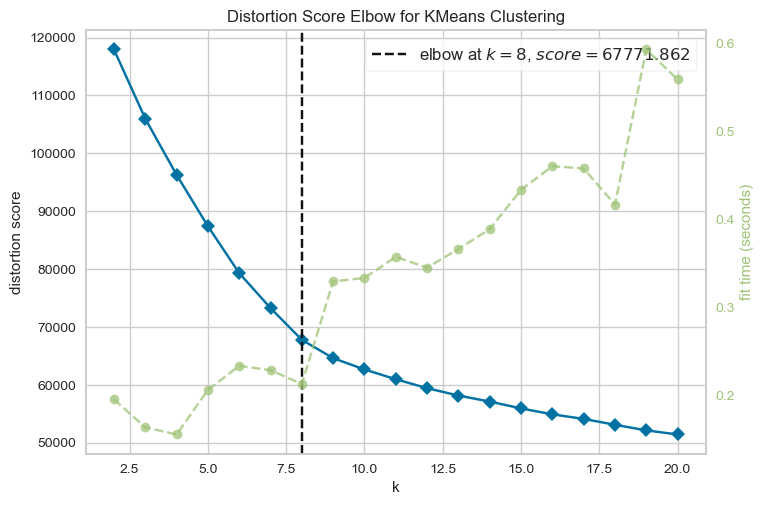

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [65]:
# visualize the elbow graph
km = KMeans()
visualizer = KElbowVisualizer(km, k=(2,21))
visualizer.fit(cluster_data)
visualizer.show()

We see an elbow at K = 8, so we will use that initially for our clustering. Now we will apply K Means clustering to our data.

In [66]:
# create k means model with 8 clusters
kmeans = KMeans(n_clusters=8)

# fit the model to the clustering data
kmeans.fit(cluster_data)

# save the cluster data in clusters variable
y_kmeans = kmeans.predict(cluster_data)

clusters = kmeans.fit_predict(cluster_data)

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Now that we have obtained our clusters, we will visualize them

In [67]:
fig1 = px.scatter(reduced_data, x=0, y=1, color=clusters)

fig1.show()

We see that while there is some overlap, most of our clusters end up grouped together, especially the cluster on the right. Maybe a n_clusters value of 8 is too large but even so, the clusters match our PCA as they are all grouped together. Let's try with n_clusters = 4

In [68]:
# create k means model with 4 clusters
kmeans = KMeans(n_clusters=4)

# fit it to the clustering data
kmeans.fit(cluster_data)

# save the k means cluster data in the clusters variable
y_kmeans = kmeans.predict(cluster_data)

clusters = kmeans.fit_predict(cluster_data)

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/angiefan/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [69]:
fig2 = px.scatter(reduced_data, x=0, y=1, color=clusters)

fig2.show()

The clusters look good and distinct from one another. To try to find out the meanings of the clusters, we will make the color hyperparameter of our plot the categorical variables in our data to see if any match the clusters.

In [70]:
fig3 = px.scatter(reduced_data, x=0, y=1, color=genre_data['key'])

#fig1.show()
fig3.show()

In [71]:
fig4 = px.scatter(reduced_data, x=0, y=1, color=genre_data['time_signature'])

fig4.show()

In [72]:
fig5 = px.scatter(reduced_data, x=0, y=1, color=genre_data['track_genre'])
fig5.show()

While none of our graphs that are colored by categorical variable look exactly like our cluster graphs, this probably means there is another feature behind the clusters that isn't included in our dataset. However, our last graph, which shows the grouping of track_genre, is interesting because the classical songs are all grouped together and separate from the other songs. There might be similar patterns with other genres that we haven't included where they separate themselves. This could be a question of tuning our grouping of subgenres which we can explore further in the future.

# Conclusion

Many viral TikTok videos, social media posts on Twitter, and articles have stated that musicians nowadays have a formula to try to get their songs to go viral. A consensus among users online states that recent releases follow a similar pattern: popular musicians attempt to place a short, < 10 second segment of the song which might be able to be used in a TikTok trend or in the background of TikTok videos. Whether or not this is true, our project attempts to examine whether the popular songs share specific attributes which have allowed them to reach hundreds of millions of streams worldwide.

It appears that each popular song itself does not specifically have "viral" attributes, such as the tempo of the song or danceability. There are likely more influential factors in a song's popularity, such as its artist. For example, artist Olivia Rodrigo has songs which differ drastically in their actual sound; *Driver's License* is generally slow and described as bedroom pop with folk elements, while *Brutal* is a faster-paced, pop-punk and grunge track. Each song peaked on the Spotify charts at #1 an #4 respectively, both in the Top 10. It appears that for global phenomenon artists like Taylor Swift and Olivia Rodrigo, it is not only the song itself that is responsible for its place on the charts, but also who created it. From our data exploration to model performance to other methods, it appears that currently songs cannot be written in a particular way to guarantee popularity in a reliable way.

Classifying songs by their genre according to their inherent attributes proved to be more fruitful. Our fully connected neural network performs at about __% accuracy in predicting whether a song is hip-hop, rock, pop, classical, or EDM. Therefore, it does appear that there are similarities and differences between musical genres. We can fairly accurately predict a song's genre just based off of features such as speechiness, instrumentalness, danceability, and more without ever listening to the song itself.

When we turned to approaching the data from an unsupervised learning perspective, we found that applying PCA and clustering with K Means was successful. We conclude that there is another feature behind the clusters that is not in our dataset. We also find it interesting that classical songs appear to group together and are separate from the other genre of songs, which provides more weight to our previous classification problems. There also may be more to explore here in future projects, and seeing if more niche genres cluster themselves or if better tuning of overarching/sub genres would yield more defined clusters.